# CRIAÇÃO DE TORAS 

In [1]:
import numpy as  np
import cv2
import matplotlib.pyplot as plt
import os
from tqdm import tqdm

In [2]:
def crop_paste_img(back,fore,fore_mask,shape_fore=(300,300),x_ofset=500,y_ofset=800):
    back_mask = np.zeros((back.shape[0],back.shape[1],back.shape[2]),dtype='uint8')
    fore= cv2.resize(fore,shape_fore,interpolation=cv2.INTER_NEAREST)
    fore_mask = cv2.resize(fore_mask,shape_fore,interpolation=cv2.INTER_NEAREST)
    
    rows,columns,chanels = fore.shape
    
    roi = back[y_ofset:y_ofset+rows, x_ofset:x_ofset + columns]
    roi_mask = back_mask[y_ofset:y_ofset+rows, x_ofset:x_ofset + columns]
    
    t,fore_mask1 = cv2.threshold(fore_mask[:,:,1],5,255,cv2.THRESH_BINARY_INV)
    
    roi = cv2.bitwise_or(roi,roi,mask=fore_mask1)
    
    final_roi = cv2.add(roi,fore)
        
    back[y_ofset:y_ofset+rows, x_ofset : x_ofset + columns]= final_roi
    back_mask[y_ofset:y_ofset+rows, x_ofset : x_ofset + columns] = fore_mask
    
    return back, back_mask

In [31]:
file_texturas = os.listdir(os.path.join(os.getcwd(),'Texturas_tora'))
file_imagens_mask = os.listdir(os.path.join(os.getcwd(),'Fotos_fundo_preto'))
file_back =  os.listdir(os.path.join(os.getcwd(),'backgroud'))


tamanhos = [(700,500),(600,500),(650,600),(700,700),(800,800),(900,900)]
indices = np.arange(len(tamanhos))

images_files_test = [i[5:] for i in os.listdir('D:\\My Drive\\Projetos\\Rachadura_Eucalipto\\Analise rachadura\\CNN\\Syntetic_images\\Images')]

file_back = [i for i in file_back if i.endswith('jpg') or i.endswith('JPG') or i.endswith('jpeg') or i.endswith('png')]
file_texturas = [i for i in file_texturas if i.endswith('jpg') or i.endswith('JPG') or i.endswith('jpeg') or i.endswith('png')]

file_imagens_mask = [i for i in file_imagens_mask if i not in images_files_test]


for i in tqdm(range(len(file_texturas))):

    name_image = np.random.choice(file_imagens_mask,1)[0]
    name_back = np.random.choice(file_back,1)[0] ### Fundo
    size = tamanhos[np.random.choice(indices, 1)[0]]
    
    img = cv2.imread(os.path.join(os.getcwd(),'Fotos_fundo_preto',name_image))
    mask = cv2.imread(os.path.join(os.getcwd(),'Mascara',name_image))
    
    img_back = cv2.imread(os.path.join(os.getcwd(),'backgroud',name_back))
    madeira = cv2.imread(os.path.join(os.getcwd(),'Texturas_tora', file_texturas[i]))

    madeira = cv2.resize(madeira,(mask.shape[1],mask.shape[0]))

    mask_madeira = np.where(mask != [50,100,2],mask,[255,255,255])
    mask_madeira[mask_madeira == 50] = 0
    mask_madeira = mask_madeira[:,:,1].astype('uint8')

    mask_rachadura = np.where(mask != [200,50,2],mask,[255,255,255])
    mask_rachadura[mask_rachadura == 100] = 0
    mask_rachadura = mask_rachadura[:,:,1].astype('uint8')

    racha = cv2.bitwise_or(img,img,mask = mask_rachadura)
    tora = cv2.bitwise_or(madeira,madeira,mask = mask_madeira)
    image_fore = cv2.bitwise_or(tora,racha)
    
    #### 2
    image_back = cv2.resize(img_back,(1024,1024),interpolation=cv2.INTER_NEAREST)
    h,w,_ = image_back.shape

    x_range = h - size[0]
    y_range = w - size[1]

    x_ofset = np.random.choice(np.arange(x_range))
    y_ofset = np.random.choice(np.arange(y_range))
   
   
    file_back.remove(name_back)
    file_imagens_mask.remove(name_image)
    
    back, back_mask = crop_paste_img(image_back,image_fore,mask,shape_fore=size,x_ofset=x_ofset,y_ofset=y_ofset)

    back_mask = back_mask[:,:,2]
    back_mask[back_mask == 2] = 1
    back_mask[back_mask == 3] = 2
    
      
    cv2.imwrite(os.path.join(os.getcwd(), 'test/images',f'TEXT_{name_image}'),back)
    cv2.imwrite(os.path.join(os.getcwd(),'test/mask',f'TEXT_{name_image}'),back_mask)

 76%|████████████████████████████████████████████████████████████▋                   | 107/141 [18:06<05:45, 10.15s/it]


AttributeError: 'NoneType' object has no attribute 'shape'

In [535]:
tora_racha = cv2.bitwise_or(tora,racha)


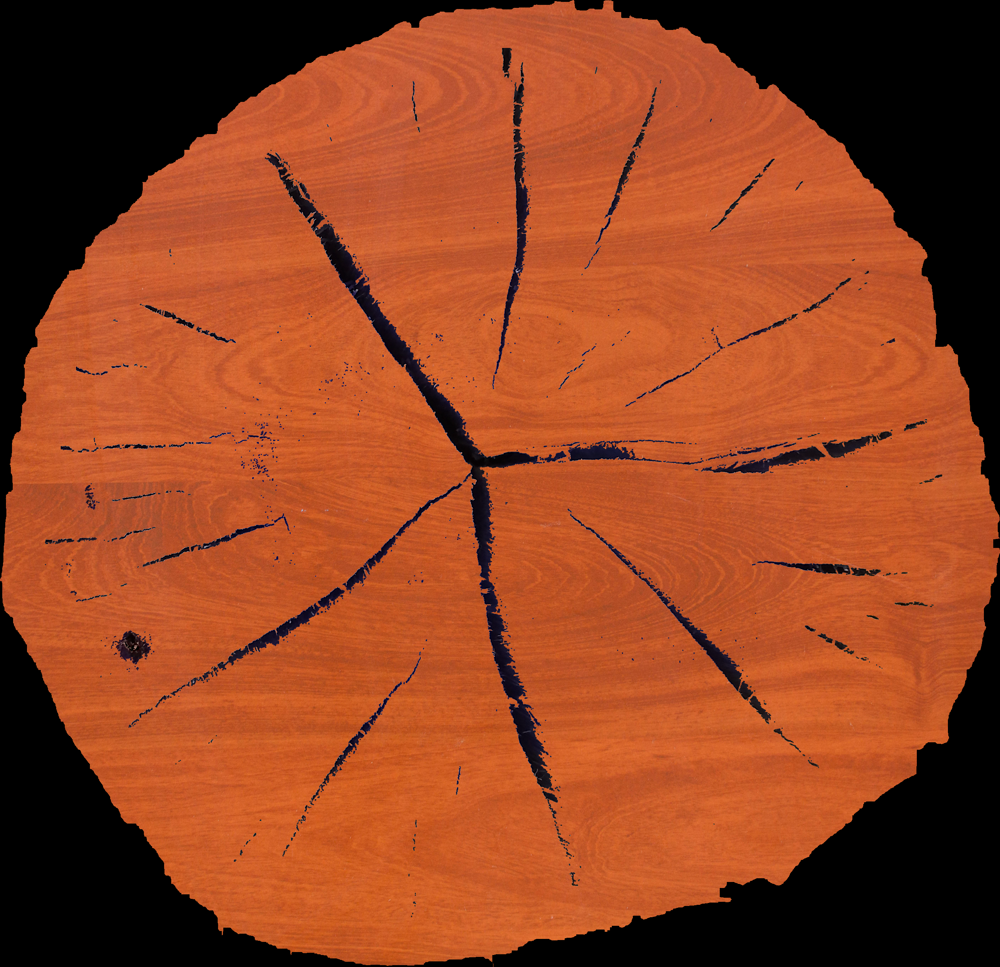

In [476]:
#import plotly.express as px
px.imshow(tora_racha)

In [29]:
from PIL import Image
#alterbnativo
#file_mascaras = os.path.join('C:\\Users\\Gustavo\\Desktop\\CNN','Syntetic_images\\Masks')
#file_images = os.path.join('C:\\Users\\Gustavo\\Desktop\\CNN','Syntetic_images\\Images')
###
file_mascaras = os.path.join(os.getcwd(),'Syntetic_images\\Masks')
file_images = os.path.join(os.getcwd(),'Syntetic_images\\Images')

tamanhos = [(700,500),(600,500),(650,600),(700,700),(800,800),(900,900)]
indices = np.arange(len(tamanhos))

file = os.listdir(os.path.join(os.getcwd(),'Fotos_fundo_preto'))

images_files_test = [i[5:] for i in os.listdir('D:\\My Drive\\Projetos\\Rachadura_Eucalipto\\Analise rachadura\\CNN\\Syntetic_images\\Images')]
file = [i for i in file if i not in images_files_test]
files_back = os.listdir(os.path.join(os.getcwd(),'backgroud'))
files_back = [i for i in files_back if i.endswith('jpg') or i.endswith('JPG') or i.endswith('jpeg')]


for i in tqdm(range(len(files_back))):
    name_image = np.random.choice(file,1)[0]
    name_back = np.random.choice(files_back,1)[0]
   
    size = tamanhos[np.random.choice(indices, 1)[0]]
    image_fore = cv2.imread(os.path.join('D:\\My Drive\\Projetos\\Rachadura_Eucalipto\\Analise rachadura\\CNN','Fotos_fundo_preto',name_image))
    image_fore_mask = cv2.imread(os.path.join('D:\\My Drive\\Projetos\\Rachadura_Eucalipto\\Analise rachadura\\CNN','Mascara',name_image))
    image_back = cv2.imread(os.path.join('D:\\My Drive\\Projetos\\Rachadura_Eucalipto\\Analise rachadura\\CNN','backgroud',name_back))
    
   
    image_back = cv2.resize(image_back,(1024,1024),interpolation=cv2.INTER_NEAREST)
    h,w,_ = image_back.shape

    x_range = h - size[0]
    y_range = w - size[1]

    x_ofset = np.random.choice(np.arange(x_range))
    y_ofset = np.random.choice(np.arange(y_range))
   
   
    files_back.remove(name_back)
    file.remove(name_image)
    
    back, back_mask = crop_paste_img(image_back,image_fore,image_fore_mask,shape_fore=size,x_ofset=x_ofset,y_ofset=y_ofset)

    back_mask = back_mask[:,:,2]
    back_mask[back_mask == 2] = 1
    back_mask[back_mask == 3] = 2
    
      
    cv2.imwrite(os.path.join(file_images,f'SYNT_{name_image}'),back)
    cv2.imwrite(os.path.join(file_mascaras,f'SYNT_{name_image}'),back_mask)


# ROTINA QUE GERA AS TEXTURAS PARA AS TORAS

In [518]:
from tqdm import tqdm

file_images = os.listdir(os.path.join(os.getcwd(),'Syntetic_images\\Images_campo\Images'))

imagens = [i for i in file_images if i.endswith('jpg') or i.endswith('JPG') or i.endswith('jpeg') or i.endswith('png')]

for i in tqdm(range(len(imagens))):
   
    img = cv2.imread(os.path.join(os.getcwd(),'Syntetic_images\\Images_campo\\Images',imagens[i]))
    mask = cv2.imread(os.path.join(os.getcwd(),'Syntetic_images\\Images_campo\\masks',imagens[i]))
    _,v = cv2.threshold(mask[:,:,1],1,255,cv2.THRESH_BINARY)
    _,tora = cv2.threshold(mask[:,:,1],0,255,cv2.THRESH_BINARY)
    kernel = np.ones((7,7),np.uint8)
    dilate = cv2.dilate(v,kernel,iterations = 1)
    dst = cv2.inpaint(img, dilate, 11, cv2.INPAINT_TELEA)
    x,y,w,h = cv2.boundingRect(tora)
    if y+150 > y+h-150 or x+150 > x+w-150:
         pass
    else:
        crop = dst[y+150:y+h-150,x+150:x+w-150]
        cv2.imwrite(os.path.join('D:\My Drive\Projetos\Rachadura_Eucalipto\Analise rachadura\CNN\Texturas_tora',imagens[i]),crop)

  0%|                                                                                          | 0/129 [00:00<?, ?it/s]

IMG_20220521_132814499.png


  1%|▋                                                                                 | 1/129 [00:10<22:07, 10.37s/it]

IMG_9176.png


  2%|█▎                                                                                | 2/129 [00:15<15:19,  7.24s/it]

IMG_9177.png


  2%|█▉                                                                                | 3/129 [00:19<11:49,  5.63s/it]

IMG_9178.png


  3%|██▌                                                                               | 4/129 [00:22<09:56,  4.77s/it]

IMG_9179.png


  4%|███▏                                                                              | 5/129 [00:27<10:09,  4.92s/it]

IMG_9180.png


  5%|███▊                                                                              | 6/129 [00:33<10:35,  5.16s/it]

IMG_9181.png


  5%|████▍                                                                             | 7/129 [00:35<08:16,  4.07s/it]

IMG_9184.png


  6%|█████                                                                             | 8/129 [00:39<08:20,  4.14s/it]

IMG_9185.png


  7%|█████▋                                                                            | 9/129 [00:43<08:15,  4.13s/it]

IMG_9186.png


  8%|██████▎                                                                          | 10/129 [00:47<08:17,  4.18s/it]

IMG_9187.png


  9%|██████▉                                                                          | 11/129 [00:51<08:01,  4.08s/it]

IMG_9188.png


  9%|███████▌                                                                         | 12/129 [00:56<08:36,  4.41s/it]

IMG_9189.png


 10%|████████▏                                                                        | 13/129 [01:00<08:15,  4.27s/it]

IMG_9191.png


 11%|████████▊                                                                        | 14/129 [01:04<08:03,  4.20s/it]

IMG_9192.png


 12%|█████████▍                                                                       | 15/129 [01:08<07:45,  4.08s/it]

IMG_9193.png


 12%|██████████                                                                       | 16/129 [01:13<08:04,  4.29s/it]

IMG_9195.png


 13%|██████████▋                                                                      | 17/129 [01:15<06:56,  3.72s/it]

IMG_9199.png


 14%|███████████▎                                                                     | 18/129 [01:19<06:48,  3.68s/it]

IMG_9205.png


 15%|███████████▉                                                                     | 19/129 [01:21<06:00,  3.28s/it]

IMG_9207.png


 16%|████████████▌                                                                    | 20/129 [01:27<07:18,  4.02s/it]

IMG_9209.png


 16%|█████████████▏                                                                   | 21/129 [01:31<07:00,  3.89s/it]

IMG_9210.png


 17%|█████████████▊                                                                   | 22/129 [01:36<07:28,  4.20s/it]

IMG_9211.png


 18%|██████████████▍                                                                  | 23/129 [01:40<07:27,  4.22s/it]

IMG_9213.png


 19%|███████████████                                                                  | 24/129 [01:45<08:00,  4.57s/it]

IMG_9214.png


 19%|███████████████▋                                                                 | 25/129 [01:51<08:23,  4.84s/it]

IMG_9217.png


 20%|████████████████▎                                                                | 26/129 [01:54<07:30,  4.38s/it]

IMG_9219.png


 21%|████████████████▉                                                                | 27/129 [01:57<06:54,  4.06s/it]

IMG_9220.png


 22%|█████████████████▌                                                               | 28/129 [02:02<07:11,  4.28s/it]

IMG_9221.png


 22%|██████████████████▏                                                              | 29/129 [02:04<05:58,  3.59s/it]

IMG_9222.png


 23%|██████████████████▊                                                              | 30/129 [02:06<04:59,  3.02s/it]

IMG_9223.png


 24%|███████████████████▍                                                             | 31/129 [02:10<05:19,  3.26s/it]

IMG_9224.png


 25%|████████████████████                                                             | 32/129 [02:14<05:37,  3.48s/it]

IMG_9225.png


 26%|████████████████████▋                                                            | 33/129 [02:16<05:12,  3.26s/it]

IMG_9226.png


 26%|█████████████████████▎                                                           | 34/129 [02:21<05:50,  3.69s/it]

IMG_9227.png


 27%|█████████████████████▉                                                           | 35/129 [02:25<05:55,  3.79s/it]

IMG_9228.png


 28%|██████████████████████▌                                                          | 36/129 [02:30<06:18,  4.07s/it]

IMG_9229.png


 29%|███████████████████████▏                                                         | 37/129 [02:36<07:03,  4.60s/it]

IMG_9230.png


 29%|███████████████████████▊                                                         | 38/129 [02:40<06:39,  4.40s/it]

IMG_9231.png


 30%|████████████████████████▍                                                        | 39/129 [02:43<06:22,  4.25s/it]

IMG_9233.png


 31%|█████████████████████████                                                        | 40/129 [02:47<05:53,  3.97s/it]

IMG_9234.png


 32%|█████████████████████████▋                                                       | 41/129 [02:48<04:49,  3.29s/it]

IMG_9237.png


 33%|██████████████████████████▎                                                      | 42/129 [02:53<05:11,  3.58s/it]

IMG_9239.png


 33%|███████████████████████████                                                      | 43/129 [02:57<05:23,  3.77s/it]

IMG_9240.png


 34%|███████████████████████████▋                                                     | 44/129 [03:02<06:00,  4.24s/it]

IMG_9244.png


 35%|████████████████████████████▎                                                    | 45/129 [03:07<06:11,  4.42s/it]

IMG_9246.png


 36%|████████████████████████████▉                                                    | 46/129 [03:11<06:04,  4.40s/it]

IMG_9248.png


 36%|█████████████████████████████▌                                                   | 47/129 [03:15<05:30,  4.03s/it]

IMG_9250.png


 37%|██████████████████████████████▏                                                  | 48/129 [03:18<05:20,  3.95s/it]

IMG_9251.png


 38%|██████████████████████████████▊                                                  | 49/129 [03:22<05:19,  4.00s/it]

IMG_9252.png


 39%|███████████████████████████████▍                                                 | 50/129 [03:26<04:54,  3.73s/it]

IMG_9253.png


 40%|████████████████████████████████                                                 | 51/129 [03:31<05:40,  4.37s/it]

IMG_9254.png


 40%|████████████████████████████████▋                                                | 52/129 [03:37<06:03,  4.72s/it]

IMG_9255.png


 41%|█████████████████████████████████▎                                               | 53/129 [03:39<05:02,  3.98s/it]

IMG_9256.png


 42%|█████████████████████████████████▉                                               | 54/129 [03:45<05:39,  4.53s/it]

IMG_9261.png


 43%|██████████████████████████████████▌                                              | 55/129 [03:51<06:16,  5.09s/it]

IMG_9264.png


 43%|███████████████████████████████████▏                                             | 56/129 [04:00<07:36,  6.26s/it]

IMG_9267.png


 44%|███████████████████████████████████▊                                             | 57/129 [04:07<07:45,  6.47s/it]

IMG_9268.png


 45%|████████████████████████████████████▍                                            | 58/129 [04:15<08:04,  6.82s/it]

IMG_9272.png


 46%|█████████████████████████████████████                                            | 59/129 [04:19<06:56,  5.95s/it]

IMG_9273.png


 47%|█████████████████████████████████████▋                                           | 60/129 [04:22<05:42,  4.96s/it]

IMG_9274.png


 47%|██████████████████████████████████████▎                                          | 61/129 [04:26<05:29,  4.85s/it]

IMG_9278.png


 48%|██████████████████████████████████████▉                                          | 62/129 [04:32<05:36,  5.03s/it]

IMG_9281.png


 49%|███████████████████████████████████████▌                                         | 63/129 [04:35<05:05,  4.63s/it]

IMG_9283.png


 50%|████████████████████████████████████████▏                                        | 64/129 [04:39<04:47,  4.43s/it]

IMG_9284.png


 50%|████████████████████████████████████████▊                                        | 65/129 [04:44<04:55,  4.62s/it]

IMG_9285.png


 51%|█████████████████████████████████████████▍                                       | 66/129 [04:48<04:30,  4.30s/it]

IMG_9287.png


 52%|██████████████████████████████████████████                                       | 67/129 [04:52<04:20,  4.21s/it]

IMG_9290.png


 53%|██████████████████████████████████████████▋                                      | 68/129 [04:55<03:58,  3.91s/it]

IMG_9296.png


 53%|███████████████████████████████████████████▎                                     | 69/129 [04:59<03:54,  3.91s/it]

IMG_9300.png


 54%|███████████████████████████████████████████▉                                     | 70/129 [05:05<04:24,  4.47s/it]

IMG_9301.png


 55%|████████████████████████████████████████████▌                                    | 71/129 [05:10<04:25,  4.58s/it]

IMG_9303.png


 56%|█████████████████████████████████████████████▏                                   | 72/129 [05:12<03:41,  3.89s/it]

IMG_9304.png


 57%|█████████████████████████████████████████████▊                                   | 73/129 [05:16<03:38,  3.90s/it]

IMG_9305.png


 57%|██████████████████████████████████████████████▍                                  | 74/129 [05:21<03:58,  4.34s/it]

IMG_9307.png


 58%|███████████████████████████████████████████████                                  | 75/129 [05:26<03:59,  4.43s/it]

IMG_9310.png


 59%|███████████████████████████████████████████████▋                                 | 76/129 [05:32<04:24,  4.99s/it]

IMG_9311.png


 60%|████████████████████████████████████████████████▎                                | 77/129 [05:37<04:17,  4.94s/it]

IMG_9313.png


 60%|████████████████████████████████████████████████▉                                | 78/129 [05:42<04:18,  5.07s/it]

IMG_9315.png


 61%|█████████████████████████████████████████████████▌                               | 79/129 [05:46<03:55,  4.71s/it]

IMG_9316.png


 62%|██████████████████████████████████████████████████▏                              | 80/129 [05:49<03:26,  4.22s/it]

IMG_20220521_131732933.png


 63%|██████████████████████████████████████████████████▊                              | 81/129 [05:55<03:42,  4.63s/it]

IMG_20220521_131738089.png


 64%|███████████████████████████████████████████████████▍                             | 82/129 [06:04<04:34,  5.84s/it]

IMG_20220521_131850109.png


 64%|████████████████████████████████████████████████████                             | 83/129 [06:15<05:45,  7.50s/it]

IMG_20220521_131854429.png


 65%|████████████████████████████████████████████████████▋                            | 84/129 [06:24<05:56,  7.91s/it]

IMG_20220521_131922849.png


 66%|█████████████████████████████████████████████████████▎                           | 85/129 [06:29<05:14,  7.14s/it]

IMG_20220521_131928175.png


 67%|██████████████████████████████████████████████████████                           | 86/129 [06:35<04:48,  6.70s/it]

IMG_20220521_131951105.png


 67%|██████████████████████████████████████████████████████▋                          | 87/129 [06:42<04:52,  6.97s/it]

IMG_20220521_131957238.png


 68%|███████████████████████████████████████████████████████▎                         | 88/129 [06:49<04:43,  6.92s/it]

IMG_20220521_132043998.png


 69%|███████████████████████████████████████████████████████▉                         | 89/129 [06:58<04:55,  7.39s/it]

IMG_20220521_132051021.png


 70%|████████████████████████████████████████████████████████▌                        | 90/129 [07:07<05:07,  7.90s/it]

IMG_20220521_132133249.png


 71%|█████████████████████████████████████████████████████████▏                       | 91/129 [07:15<05:06,  8.06s/it]

IMG_20220521_132138771.png


 71%|█████████████████████████████████████████████████████████▊                       | 92/129 [07:24<05:04,  8.22s/it]

IMG_20220521_132201132.png


 72%|██████████████████████████████████████████████████████████▍                      | 93/129 [07:29<04:24,  7.34s/it]

IMG_20220521_132211724.png


 73%|███████████████████████████████████████████████████████████                      | 94/129 [07:35<03:57,  6.80s/it]

IMG_20220521_132220416.png


 74%|███████████████████████████████████████████████████████████▋                     | 95/129 [07:45<04:27,  7.86s/it]

IMG_20220521_132224344.png


 74%|████████████████████████████████████████████████████████████▎                    | 96/129 [07:50<03:53,  7.07s/it]

IMG_20220521_132238987.png


 75%|████████████████████████████████████████████████████████████▉                    | 97/129 [07:57<03:40,  6.90s/it]

IMG_20220521_132244200.png


 76%|█████████████████████████████████████████████████████████████▌                   | 98/129 [08:03<03:29,  6.75s/it]

IMG_20220521_132249696.png


 77%|██████████████████████████████████████████████████████████████▏                  | 99/129 [08:12<03:39,  7.31s/it]

IMG_20220521_132301667.png


 78%|██████████████████████████████████████████████████████████████                  | 100/129 [08:18<03:22,  6.97s/it]

IMG_20220521_132307570.png


 78%|██████████████████████████████████████████████████████████████▋                 | 101/129 [08:22<02:52,  6.15s/it]

IMG_20220521_132312365.png


 79%|███████████████████████████████████████████████████████████████▎                | 102/129 [08:28<02:44,  6.11s/it]

IMG_20220521_132317539.png


 80%|███████████████████████████████████████████████████████████████▉                | 103/129 [08:35<02:46,  6.39s/it]

IMG_20220521_132325437.png


 81%|████████████████████████████████████████████████████████████████▍               | 104/129 [08:42<02:42,  6.49s/it]

IMG_20220521_132329485.png


 81%|█████████████████████████████████████████████████████████████████               | 105/129 [08:48<02:33,  6.42s/it]

IMG_20220521_132335534.png


 82%|█████████████████████████████████████████████████████████████████▋              | 106/129 [08:53<02:20,  6.09s/it]

IMG_20220521_132340201.png


 83%|██████████████████████████████████████████████████████████████████▎             | 107/129 [09:00<02:14,  6.10s/it]

IMG_20220521_132352862.png


 84%|██████████████████████████████████████████████████████████████████▉             | 108/129 [09:06<02:08,  6.11s/it]

IMG_20220521_132357034.png


 84%|███████████████████████████████████████████████████████████████████▌            | 109/129 [09:13<02:08,  6.44s/it]

IMG_20220521_132410150.png


 85%|████████████████████████████████████████████████████████████████████▏           | 110/129 [09:19<01:58,  6.22s/it]

IMG_20220521_132415161.png


 86%|████████████████████████████████████████████████████████████████████▊           | 111/129 [09:25<01:54,  6.38s/it]

IMG_20220521_132438687.png


 87%|█████████████████████████████████████████████████████████████████████▍          | 112/129 [09:32<01:51,  6.56s/it]

IMG_20220521_132442117.png


 88%|██████████████████████████████████████████████████████████████████████          | 113/129 [09:38<01:41,  6.32s/it]

IMG_20220521_132450203.png


 88%|██████████████████████████████████████████████████████████████████████▋         | 114/129 [09:43<01:27,  5.84s/it]

IMG_20220521_132455748.png


 89%|███████████████████████████████████████████████████████████████████████▎        | 115/129 [09:47<01:14,  5.31s/it]

IMG_20220521_132500407.png


 90%|███████████████████████████████████████████████████████████████████████▉        | 116/129 [09:52<01:08,  5.30s/it]

IMG_20220521_132510780.png


 91%|████████████████████████████████████████████████████████████████████████▌       | 117/129 [09:56<00:59,  4.95s/it]

IMG_20220521_132530434.png


 91%|█████████████████████████████████████████████████████████████████████████▏      | 118/129 [10:02<00:56,  5.10s/it]

IMG_20220521_132534581.png


 92%|█████████████████████████████████████████████████████████████████████████▊      | 119/129 [10:06<00:49,  4.96s/it]

IMG_20220521_132546723.png


 93%|██████████████████████████████████████████████████████████████████████████▍     | 120/129 [10:12<00:46,  5.16s/it]

IMG_20220521_132552468.png


 94%|███████████████████████████████████████████████████████████████████████████     | 121/129 [10:18<00:42,  5.30s/it]

IMG_20220521_132617769.png


 95%|███████████████████████████████████████████████████████████████████████████▋    | 122/129 [10:23<00:37,  5.42s/it]

IMG_20220521_132653343.png


 95%|████████████████████████████████████████████████████████████████████████████▎   | 123/129 [10:28<00:30,  5.16s/it]

IMG_20220521_132658408.png


 96%|████████████████████████████████████████████████████████████████████████████▉   | 124/129 [10:38<00:33,  6.77s/it]

IMG_20220521_132705468.png


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 125/129 [10:42<00:23,  5.95s/it]

IMG_20220521_132725565.png


 98%|██████████████████████████████████████████████████████████████████████████████▏ | 126/129 [10:46<00:15,  5.29s/it]

IMG_20220521_132729176.png


 98%|██████████████████████████████████████████████████████████████████████████████▊ | 127/129 [10:51<00:10,  5.11s/it]

IMG_20220521_132741068.png


 99%|███████████████████████████████████████████████████████████████████████████████▍| 128/129 [10:55<00:04,  4.83s/it]

IMG_20220521_132744033.png


100%|████████████████████████████████████████████████████████████████████████████████| 129/129 [11:00<00:00,  5.12s/it]
